In [ ]:
###Challenge 2
"""Plot twist! The expert who priced these gems has now vanished. 
Francesco needs you to be the new diamond evaluator. 
He's looking for a model that predicts a gem's worth based on its characteristics. 
And, because Francesco's clientele is as demanding as he is, he wants the why behind every price tag.

Create another Jupyter notebook where you develop and evaluate your model.

In [ ]:
"""PLAN
1) ML
    -LR, DT, RF trade-off
    -Evaluation
2) LIME
    -XAI
    
3) OPTIMIZATION
    - Use the correlations to give the weights for the price

In [1]:
import pandas as pd


diamonds_no_classification_path = "C:\\Users\\cassiorodrigo.crisfa\\Documents\\GitHub\\xtream-ai-assignment\\Cristani\\diamonds.tsv"
diamonds_df = pd.read_csv(diamonds_no_classification_path, sep='\t')

# Split the 'price' column and create a new 'prices.csv' file
prices_df = diamonds_df['price'].copy()
prices_df.to_csv("C:\\Users\\cassiorodrigo.crisfa\\Documents\\GitHub\\xtream-ai-assignment\\Cristani\\prices.csv", header=True, index=False)

# Save the remaining columns without 'price' in 'data_diamonds.csv'
data_diamonds_df = diamonds_df.drop(columns=['price'])
data_diamonds_df.to_csv("C:\\Users\\cassiorodrigo.crisfa\\Documents\\GitHub\\xtream-ai-assignment\\Cristani\\data_diamonds.csv", sep='\t', index=False)


Mean Squared Error: 1531553.3805091383


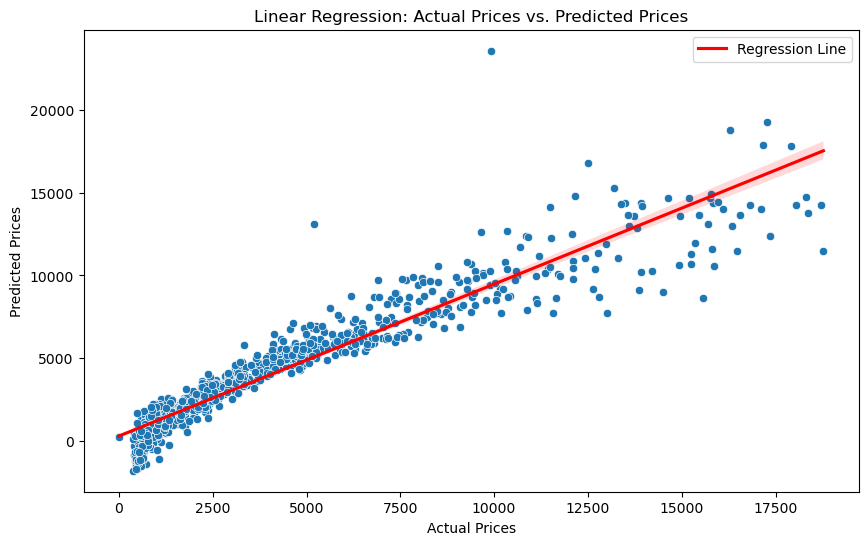

In [7]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
import matplotlib.pyplot as plt
import seaborn as sns

# Read the data_diamonds.csv file
data_diamonds_path = "C:\\Users\\cassiorodrigo.crisfa\\Documents\\GitHub\\xtream-ai-assignment\\Cristani\\diamonds_C2.csv"
data_diamonds_df = pd.read_csv(data_diamonds_path, sep=',')

# Define features (X) and target variable (y)
data_diamonds_df = data_diamonds_df.drop(columns=['color_classification'])
X = data_diamonds_df.drop(columns=['price'])
y = data_diamonds_df['price']

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize the linear regression model
model = LinearRegression()

# Train the model
model.fit(X_train, y_train)

# Make predictions on the test set
y_pred = model.predict(X_test)

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
print(f'Mean Squared Error: {mse}')

# Plot the predicted prices against the actual prices using Seaborn
plt.figure(figsize=(10, 6))
sns.scatterplot(x=y_test, y=y_pred)
sns.regplot(x=y_test, y=y_pred, scatter=False, color='red', label='Regression Line')

plt.xlabel('Actual Prices')
plt.ylabel('Predicted Prices')
plt.title('Linear Regression: Actual Prices vs. Predicted Prices')
plt.legend()
plt.show()


Target variable range: -1 to 18787
Mean Squared Error: 1531553.3805091383
Percentage relation between MSE and target variable range: 8151.76%


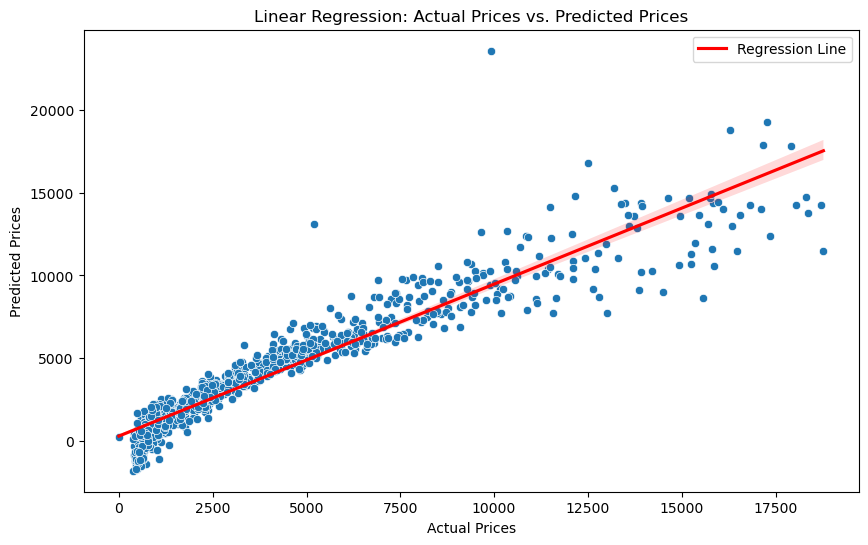

In [3]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
import matplotlib.pyplot as plt
import seaborn as sns

# Read the data_diamonds.csv file
data_diamonds_path = "C:\\Users\\cassiorodrigo.crisfa\\Documents\\GitHub\\xtream-ai-assignment\\Cristani\\diamonds_C2.csv"
data_diamonds_df = pd.read_csv(data_diamonds_path, sep=',')

# Define features (X) and target variable (y)
data_diamonds_df = data_diamonds_df.drop(columns=['color_classification'])
X = data_diamonds_df.drop(columns=['price'])
y = data_diamonds_df['price']

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Print the range of the target variable
target_range = y.max() - y.min()
print(f"Target variable range: {y.min()} to {y.max()}")

# Initialize the linear regression model
model = LinearRegression()

# Train the model
model.fit(X_train, y_train)

# Make predictions on the test set
y_pred = model.predict(X_test)

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
print(f'Mean Squared Error: {mse}')

# Calculate the percentage relation between MSE and target variable range
percentage_relation = (mse / target_range) * 100
print(f"Percentage relation between MSE and target variable range: {percentage_relation:.2f}%")

# Plot the predicted prices against the actual prices using Seaborn
plt.figure(figsize=(10, 6))
sns.scatterplot(x=y_test, y=y_pred)
sns.regplot(x=y_test, y=y_pred, scatter=False, color='red', label='Regression Line')

plt.xlabel('Actual Prices')
plt.ylabel('Predicted Prices')
plt.title('Linear Regression: Actual Prices vs. Predicted Prices')
plt.legend()
plt.show()


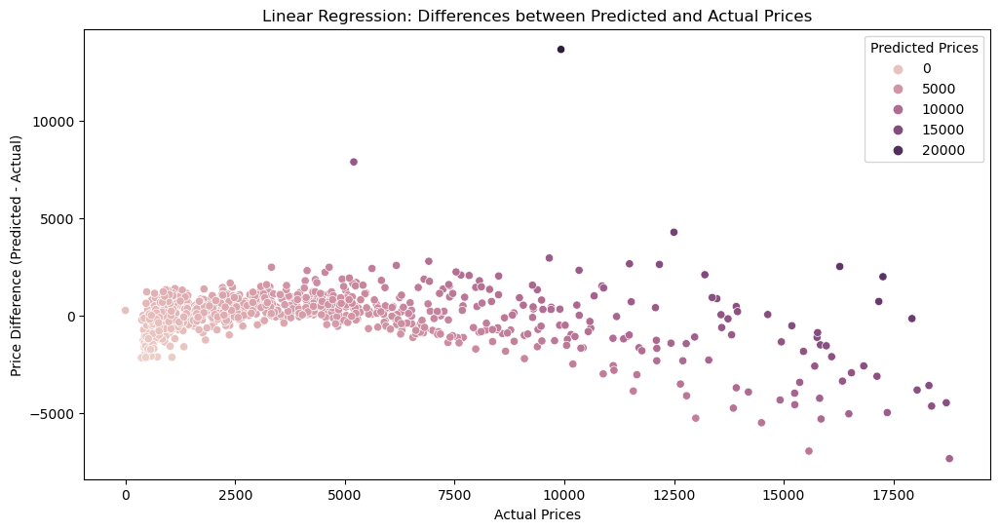

In [4]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
import matplotlib.pyplot as plt
import seaborn as sns


data_diamonds_path = "C:\\Users\\cassiorodrigo.crisfa\\Documents\\GitHub\\xtream-ai-assignment\\Cristani\\diamonds_C2.csv"
data_diamonds_df = pd.read_csv(data_diamonds_path, sep=',')

# Define features (X) and target variable (y)
data_diamonds_df = data_diamonds_df.drop(columns=['color_classification'])
X = data_diamonds_df.drop(columns=['price'])
y = data_diamonds_df['price']

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize the linear regression model
model = LinearRegression()

# Train the model
model.fit(X_train, y_train)

# Make predictions on the test set
y_pred = model.predict(X_test)

# Create a DataFrame for visualization
df_visualization = pd.DataFrame({'Actual Prices': y_test, 'Predicted Prices': y_pred})

# Calculate the differences between predicted and actual prices
df_visualization['Price Difference'] = df_visualization['Predicted Prices'] - df_visualization['Actual Prices']

# Plot the differences with actual prices on the x-axis
plt.figure(figsize=(12, 6))
sns.scatterplot(x='Actual Prices', y='Price Difference', hue='Predicted Prices', data=df_visualization)

plt.xlabel('Actual Prices')
plt.ylabel('Price Difference (Predicted - Actual)')
plt.title('Linear Regression: Differences between Predicted and Actual Prices')
plt.legend(title='Predicted Prices')
plt.show()


Total samples: 1000
Total overestimated samples (> 0): 567 (56.70%)
Total underestimated samples (< 0): 433 (43.30%)
Average absolute difference for overestimated samples: 697.04
Standard deviation for overestimated samples: 827.98
Average absolute difference for underestimated samples: 936.14
Standard deviation for underestimated samples: 1063.47


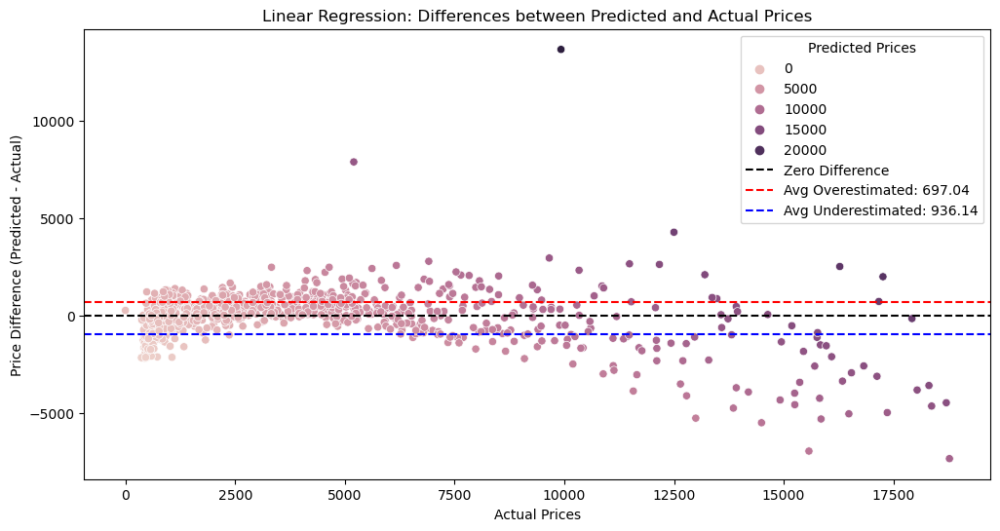

In [8]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
import matplotlib.pyplot as plt
import seaborn as sns


data_diamonds_path = "C:\\Users\\cassiorodrigo.crisfa\\Documents\\GitHub\\xtream-ai-assignment\\Cristani\\diamonds_C2.csv"
data_diamonds_df = pd.read_csv(data_diamonds_path, sep=',')

# Define features (X) and target variable (y)
data_diamonds_df = data_diamonds_df.drop(columns=['color_classification'])
X = data_diamonds_df.drop(columns=['price'])
y = data_diamonds_df['price']

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize the linear regression model
model = LinearRegression()

# Train the model
model.fit(X_train, y_train)

# Make predictions on the test set
y_pred = model.predict(X_test)

# Create a DataFrame for visualization
df_visualization = pd.DataFrame({'Actual Prices': y_test, 'Predicted Prices': y_pred})

# Calculate the differences between predicted and actual prices
df_visualization['Price Difference'] = df_visualization['Predicted Prices'] - df_visualization['Actual Prices']

# Calculate the absolute differences
df_visualization['Absolute Difference'] = abs(df_visualization['Price Difference'])

# Set a threshold for underestimation (adjust as needed)
underestimate_threshold = 0

# Identify underestimated and overestimated samples
df_visualization['Underestimated'] = df_visualization['Price Difference'] < underestimate_threshold
df_visualization['Overestimated'] = df_visualization['Price Difference'] > underestimate_threshold

# Count the number of samples
total_samples = len(df_visualization)
total_overestimated = sum(df_visualization['Overestimated'])
total_underestimated = sum(df_visualization['Underestimated'])

# Calculate average and standard deviation for overestimated and underestimated samples
avg_overestimated = df_visualization.loc[df_visualization['Overestimated'], 'Absolute Difference'].mean()
std_overestimated = df_visualization.loc[df_visualization['Overestimated'], 'Absolute Difference'].std()

avg_underestimated = df_visualization.loc[df_visualization['Underestimated'], 'Absolute Difference'].mean()
std_underestimated = df_visualization.loc[df_visualization['Underestimated'], 'Absolute Difference'].std()

# Print the number and percentage of samples
print(f'Total samples: {total_samples}')
print(f'Total overestimated samples (> {underestimate_threshold}): {total_overestimated} ({total_overestimated / total_samples * 100:.2f}%)')
print(f'Total underestimated samples (< {underestimate_threshold}): {total_underestimated} ({total_underestimated / total_samples * 100:.2f}%)')

# Print average and standard deviation for overestimated and underestimated samples
print(f'Average absolute difference for overestimated samples: {avg_overestimated:.2f}')
print(f'Standard deviation for overestimated samples: {std_overestimated:.2f}')

print(f'Average absolute difference for underestimated samples: {avg_underestimated:.2f}')
print(f'Standard deviation for underestimated samples: {std_underestimated:.2f}')

# Plot the differences with actual prices on the x-axis
plt.figure(figsize=(12, 6))
sns.scatterplot(x='Actual Prices', y='Price Difference', hue='Predicted Prices', data=df_visualization)
plt.axhline(y=0, color='black', linestyle='--', label='Zero Difference')
plt.axhline(y=avg_overestimated, color='red', linestyle='--', label=f'Avg Overestimated: {avg_overestimated:.2f}')
plt.axhline(y=-avg_underestimated, color='blue', linestyle='--', label=f'Avg Underestimated: {avg_underestimated:.2f}')

plt.xlabel('Actual Prices')
plt.ylabel('Price Difference (Predicted - Actual)')
plt.title('Linear Regression: Differences between Predicted and Actual Prices')
plt.legend(title='Predicted Prices')
plt.show()


Mean Squared Error: 1531553.3805091383


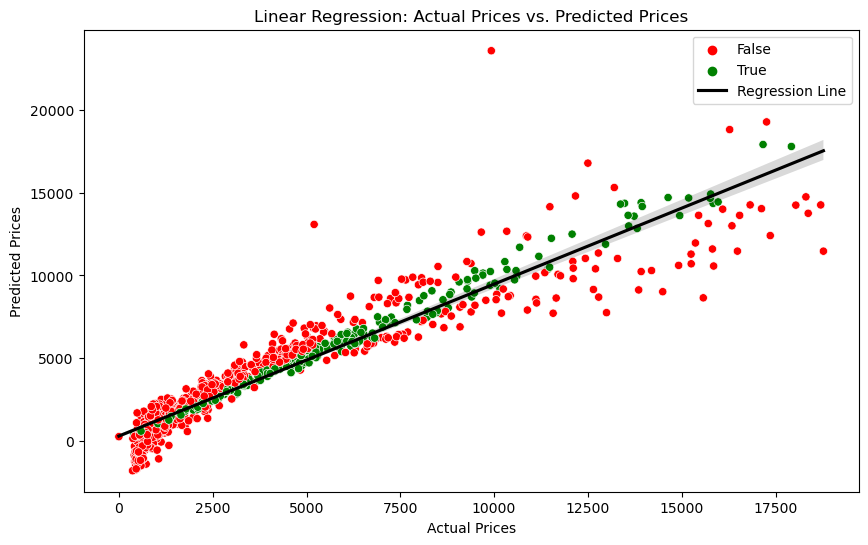

In [10]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
import matplotlib.pyplot as plt
import seaborn as sns

# Read the data_diamonds.csv file
data_diamonds_path = "C:\\Users\\cassiorodrigo.crisfa\\Documents\\GitHub\\xtream-ai-assignment\\Cristani\\diamonds_C2.csv"
data_diamonds_df = pd.read_csv(data_diamonds_path, sep=',')

# Define features (X) and target variable (y)
data_diamonds_df = data_diamonds_df.drop(columns=['color_classification'])
X = data_diamonds_df.drop(columns=['price'])
y = data_diamonds_df['price']

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize the linear regression model
model = LinearRegression()

# Train the model
model.fit(X_train, y_train)

# Make predictions on the test set
y_pred = model.predict(X_test)

# Calculate percentage difference
percentage_difference = abs((y_pred - y_test) / y_test) * 100

# Identify samples within a 10% difference range
within_range = percentage_difference <= 10

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
print(f'Mean Squared Error: {mse}')

# Plot the predicted prices against the actual prices using Seaborn
plt.figure(figsize=(10, 6))
sns.scatterplot(x=y_test, y=y_pred, hue=within_range, palette={True: 'green', False: 'red'}, legend='full')
sns.regplot(x=y_test, y=y_pred, scatter=False, color='black', label='Regression Line')

plt.xlabel('Actual Prices')
plt.ylabel('Predicted Prices')
plt.title('Linear Regression: Actual Prices vs. Predicted Prices')
plt.legend()
plt.show()


Mean Squared Error: 1531553.3805091383

Statistics:
Total Samples: 1000
Samples Within 10% Difference Range: 264 (26.40%)
Samples Outside 10% Difference Range: 736 (73.60%)


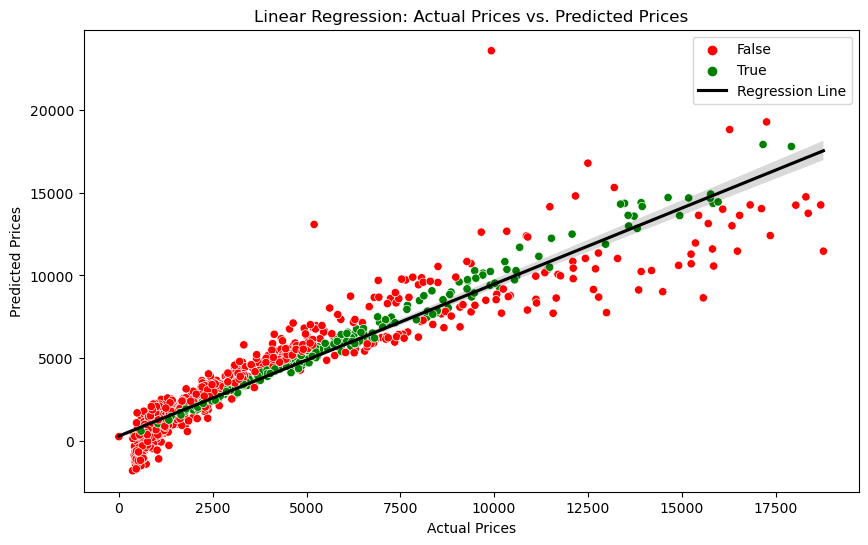

In [11]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
import matplotlib.pyplot as plt
import seaborn as sns

# Read the data_diamonds.csv file
data_diamonds_path = "C:\\Users\\cassiorodrigo.crisfa\\Documents\\GitHub\\xtream-ai-assignment\\Cristani\\diamonds_C2.csv"
data_diamonds_df = pd.read_csv(data_diamonds_path, sep=',')

# Define features (X) and target variable (y)
data_diamonds_df = data_diamonds_df.drop(columns=['color_classification'])
X = data_diamonds_df.drop(columns=['price'])
y = data_diamonds_df['price']

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize the linear regression model
model = LinearRegression()

# Train the model
model.fit(X_train, y_train)

# Make predictions on the test set
y_pred = model.predict(X_test)

# Calculate percentage difference
percentage_difference = abs((y_pred - y_test) / y_test) * 100

# Identify samples within a 10% difference range
within_range = percentage_difference <= 10

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
print(f'Mean Squared Error: {mse}')

# Calculate statistics
total_samples = len(y_test)
within_range_samples = within_range.sum()
outside_range_samples = total_samples - within_range_samples
within_range_percentage = (within_range_samples / total_samples) * 100

# Print statistics
print(f'\nStatistics:')
print(f'Total Samples: {total_samples}')
print(f'Samples Within 10% Difference Range: {within_range_samples} ({within_range_percentage:.2f}%)')
print(f'Samples Outside 10% Difference Range: {outside_range_samples} ({100 - within_range_percentage:.2f}%)')

# Plot the predicted prices against the actual prices using Seaborn
plt.figure(figsize=(10, 6))
sns.scatterplot(x=y_test, y=y_pred, hue=within_range, palette={True: 'green', False: 'red'}, legend='full')
sns.regplot(x=y_test, y=y_pred, scatter=False, color='black', label='Regression Line')

plt.xlabel('Actual Prices')
plt.ylabel('Predicted Prices')
plt.title('Linear Regression: Actual Prices vs. Predicted Prices')
plt.legend()
plt.show()


Mean Squared Error: 1531553.3805091383

Statistics:
Total Samples: 1000
Samples Within 10% Difference Range: 264 (26.40%)
Samples Outside 10% Difference Range: 736 (73.60%)

Statistics for Samples Within 10% Difference Range:
Low Price Samples: 181 (68.56%)
Middle Price Samples: 65 (24.62%)
High Price Samples: 18 (6.82%)


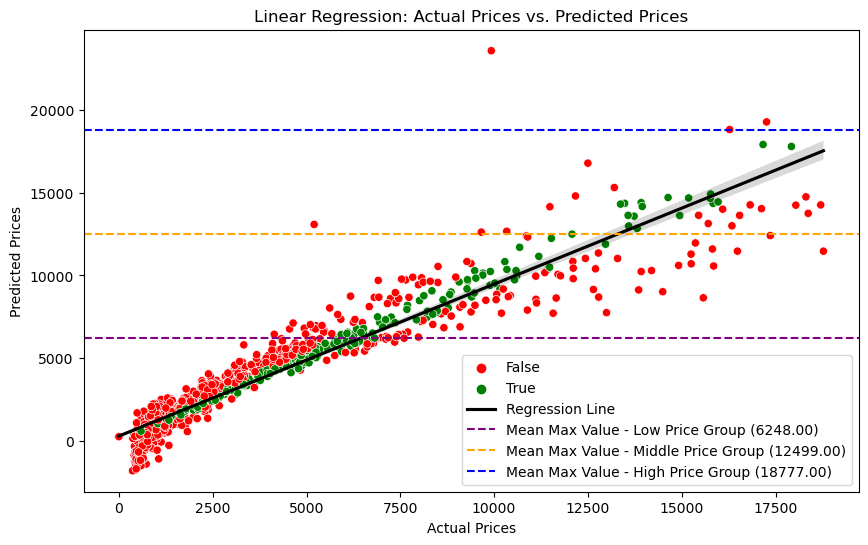

In [16]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
import matplotlib.pyplot as plt
import seaborn as sns

# Read the data_diamonds.csv file
data_diamonds_path = "C:\\Users\\cassiorodrigo.crisfa\\Documents\\GitHub\\xtream-ai-assignment\\Cristani\\diamonds_C2.csv"
data_diamonds_df = pd.read_csv(data_diamonds_path, sep=',')

# Define features (X) and target variable (y)
data_diamonds_df = data_diamonds_df.drop(columns=['color_classification'])
X = data_diamonds_df.drop(columns=['price'])
y = data_diamonds_df['price']

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize the linear regression model
model = LinearRegression()

# Train the model
model.fit(X_train, y_train)

# Make predictions on the test set
y_pred = model.predict(X_test)

# Calculate percentage difference
percentage_difference = abs((y_pred - y_test) / y_test) * 100

# Identify samples within a 10% difference range
within_range = percentage_difference <= 10

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
print(f'Mean Squared Error: {mse}')

# Calculate statistics
total_samples = len(y_test)
within_range_samples = within_range.sum()
outside_range_samples = total_samples - within_range_samples
within_range_percentage = (within_range_samples / total_samples) * 100

# Divide true members into three groups: highest price, middle price, low price
max_price = y_test.max()
min_price = y_test.min()
price_range = max_price - min_price
threshold_low = min_price + (price_range * 1/3)
threshold_high = min_price + (price_range * 2/3)

# Categorize true values into three groups
high_price_group = y_test[y_test >= threshold_high]
middle_price_group = y_test[(y_test >= threshold_low) & (y_test < threshold_high)]
low_price_group = y_test[y_test < threshold_low]

# Calculate the mean of the maximum value for each category
mean_max_value_high_price = high_price_group.max()
mean_max_value_middle_price = middle_price_group.max()
mean_max_value_low_price = low_price_group.max()

# Print statistics
print(f'\nStatistics:')
print(f'Total Samples: {total_samples}')
print(f'Samples Within 10% Difference Range: {within_range_samples} ({within_range_percentage:.2f}%)')
print(f'Samples Outside 10% Difference Range: {outside_range_samples} ({100 - within_range_percentage:.2f}%)')

# Statistics for each category within the 10% difference range
within_range_low_price_samples = len(low_price_group[within_range])
within_range_middle_price_samples = len(middle_price_group[within_range])
within_range_high_price_samples = len(high_price_group[within_range])

within_range_low_price_percentage = (within_range_low_price_samples / within_range_samples) * 100
within_range_middle_price_percentage = (within_range_middle_price_samples / within_range_samples) * 100
within_range_high_price_percentage = (within_range_high_price_samples / within_range_samples) * 100

print(f'\nStatistics for Samples Within 10% Difference Range:')
print(f'Low Price Samples: {within_range_low_price_samples} ({within_range_low_price_percentage:.2f}%)')
print(f'Middle Price Samples: {within_range_middle_price_samples} ({within_range_middle_price_percentage:.2f}%)')
print(f'High Price Samples: {within_range_high_price_samples} ({within_range_high_price_percentage:.2f}%)')

# Plot the predicted prices against the actual prices using Seaborn
plt.figure(figsize=(10, 6))

# Define colors for low, middle, and high price samples within the 10% difference range
low_price_color = 'purple'
middle_price_color = 'orange'
high_price_color = 'blue'

# Scatter plot with color-coded categories
sns.scatterplot(x=y_test, y=y_pred, hue=within_range, palette={True: 'green', False: 'red'}, legend='full')

# Regression line
sns.regplot(x=y_test, y=y_pred, scatter=False, color='black', label='Regression Line')

# Dash lines with colors for mean max values
plt.axhline(mean_max_value_low_price, color=low_price_color, linestyle='--', label=f'Low Price Group ({mean_max_value_low_price:.2f})')
plt.axhline(mean_max_value_middle_price, color=middle_price_color, linestyle='--', label=f'Middle Price Group ({mean_max_value_middle_price:.2f})')
plt.axhline(mean_max_value_high_price, color=high_price_color, linestyle='--', label=f'High Price Group ({mean_max_value_high_price:.2f})')

plt.xlabel('Actual Prices')
plt.ylabel('Predicted Prices')
plt.title('Linear Regression: Actual Prices vs. Predicted Prices')
plt.legend()
plt.show()



Mean Squared Error: 1531553.3805091383

Total Samples Statistics: 1000
High Price Samples: 52 (5.20%)
Middle Price Samples: 151 (15.10%)
Low Price Samples: 797 (79.70%)

Samples Within 10% Difference Range Statistics: 264 Percentage = 26.4 %
High Price Samples: 18 (6.82%)
Middle Price Samples: 65 (24.62%)
Low Price Samples: 181 (68.56%)


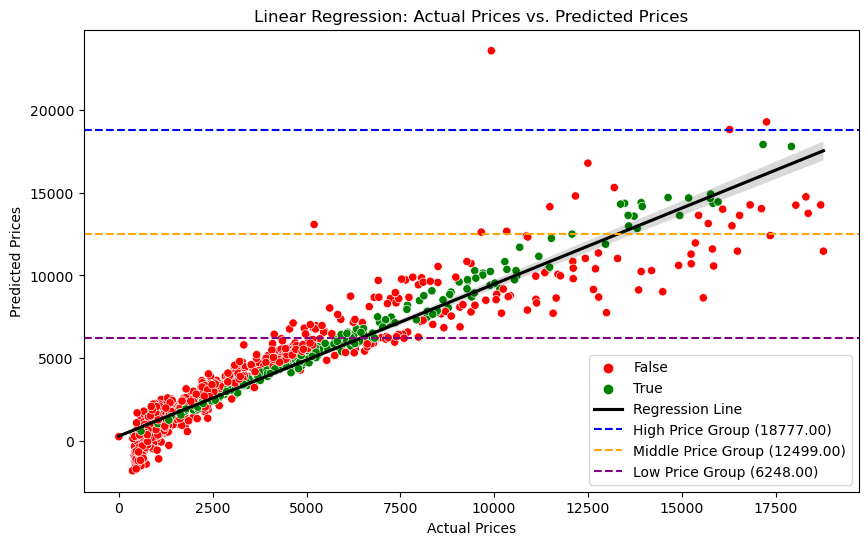

In [29]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
import matplotlib.pyplot as plt
import seaborn as sns

# Read the data_diamonds.csv file
data_diamonds_path = "C:\\Users\\cassiorodrigo.crisfa\\Documents\\GitHub\\xtream-ai-assignment\\Cristani\\diamonds_C2.csv"
data_diamonds_df = pd.read_csv(data_diamonds_path, sep=',')

# Define features (X) and target variable (y)
data_diamonds_df = data_diamonds_df.drop(columns=['color_classification'])
X = data_diamonds_df.drop(columns=['price'])
y = data_diamonds_df['price']

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize the linear regression model
model = LinearRegression()

# Train the model
model.fit(X_train, y_train)

# Make predictions on the test set
y_pred = model.predict(X_test)

# Calculate percentage difference
percentage_difference = abs((y_pred - y_test) / y_test) * 100

# Identify samples within a 10% difference range
within_range = percentage_difference <= 10

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
print(f'Mean Squared Error: {mse}')

# Calculate statistics for total samples
total_samples = len(y_test)
within_range_samples = within_range.sum()
outside_range_samples = total_samples - within_range_samples
within_range_percentage = (within_range_samples / total_samples) * 100

# Divide into three groups: highest price, middle price, low price
max_price = y_test.max()
min_price = y_test.min()
price_range = max_price - min_price
threshold_low = min_price + (price_range * 1/3)
threshold_high = min_price + (price_range * 2/3)

# Categorize true values into three groups
high_price_group = y_test[y_test >= threshold_high]
middle_price_group = y_test[(y_test >= threshold_low) & (y_test < threshold_high)]
low_price_group = y_test[y_test < threshold_low]

# Calculate the mean of the maximum value for each category
mean_max_value_high_price = high_price_group.max()
mean_max_value_middle_price = middle_price_group.max()
mean_max_value_low_price = low_price_group.max()
pct = 100*within_range_samples/total_samples

# Print statistics for total samples
print(f'\nTotal Samples Statistics:', total_samples)
print(f'High Price Samples: {len(high_price_group)} ({(len(high_price_group) / total_samples) * 100:.2f}%)')
print(f'Middle Price Samples: {len(middle_price_group)} ({(len(middle_price_group) / total_samples) * 100:.2f}%)')
print(f'Low Price Samples: {len(low_price_group)} ({(len(low_price_group) / total_samples) * 100:.2f}%)')

# Print statistics for samples within 10% difference range
print(f'\nSamples Within 10% Difference Range Statistics:', within_range_samples, 'Percentage =', pct, '%')
print(f'High Price Samples: {len(high_price_group[within_range])} ({(len(high_price_group[within_range]) / within_range_samples) * 100:.2f}%)')
print(f'Middle Price Samples: {len(middle_price_group[within_range])} ({(len(middle_price_group[within_range]) / within_range_samples) * 100:.2f}%)')
print(f'Low Price Samples: {len(low_price_group[within_range])} ({(len(low_price_group[within_range]) / within_range_samples) * 100:.2f}%)')

# Plot the predicted prices against the actual prices using Seaborn
plt.figure(figsize=(10, 6))

# Define colors for low, middle, and high price samples within the 10% difference range
low_price_color = 'purple'
middle_price_color = 'orange'
high_price_color = 'blue'

# Scatter plot with color-coded categories
sns.scatterplot(x=y_test, y=y_pred, hue=within_range, palette={True: 'green', False: 'red'}, legend='full')

# Regression line
sns.regplot(x=y_test, y=y_pred, scatter=False, color='black', label='Regression Line')

# Dash lines with colors for mean max values
plt.axhline(mean_max_value_high_price, color=high_price_color, linestyle='--', label=f'High Price Group ({mean_max_value_high_price:.2f})')
plt.axhline(mean_max_value_middle_price, color=middle_price_color, linestyle='--', label=f'Middle Price Group ({mean_max_value_middle_price:.2f})')
plt.axhline(mean_max_value_low_price, color=low_price_color, linestyle='--', label=f'Low Price Group ({mean_max_value_low_price:.2f})')

plt.xlabel('Actual Prices')
plt.ylabel('Predicted Prices')
plt.title('Linear Regression: Actual Prices vs. Predicted Prices')
plt.legend()
plt.show()


Mean Squared Error: 1059376.764

Total Samples Statistics: 1000
High Price Samples: 52 (5.20%)
Middle Price Samples: 151 (15.10%)
Low Price Samples: 797 (79.70%)

Samples Within 10% Difference Range Statistics: 547 Percentage = 54.7 %
High Price Samples: 23 (4.20%)
Middle Price Samples: 93 (17.00%)
Low Price Samples: 431 (78.79%)


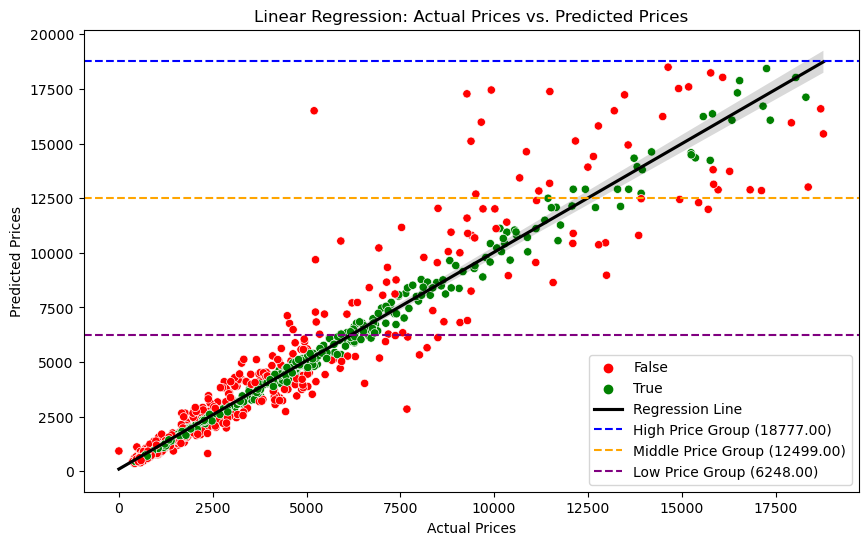

In [36]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.metrics import mean_squared_error
import matplotlib.pyplot as plt
import seaborn as sns

# Read the data_diamonds.csv file
data_diamonds_path = "C:\\Users\\cassiorodrigo.crisfa\\Documents\\GitHub\\xtream-ai-assignment\\Cristani\\diamonds_C2.csv"
data_diamonds_df = pd.read_csv(data_diamonds_path, sep=',')

# Define features (X) and target variable (y)
data_diamonds_df = data_diamonds_df.drop(columns=['color_classification'])
X = data_diamonds_df.drop(columns=['price'])
y = data_diamonds_df['price']

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize the linear regression model
model = DecisionTreeRegressor()

# Train the model
model.fit(X_train, y_train)

# Make predictions on the test set
y_pred = model.predict(X_test)

# Calculate percentage difference
percentage_difference = abs((y_pred - y_test) / y_test) * 100

# Identify samples within a 10% difference range
within_range = percentage_difference <= 10

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
print(f'Mean Squared Error: {mse}')

# Calculate statistics for total samples
total_samples = len(y_test)
within_range_samples = within_range.sum()
outside_range_samples = total_samples - within_range_samples
within_range_percentage = (within_range_samples / total_samples) * 100

# Divide into three groups: highest price, middle price, low price
max_price = y_test.max()
min_price = y_test.min()
price_range = max_price - min_price
threshold_low = min_price + (price_range * 1/3)
threshold_high = min_price + (price_range * 2/3)

# Categorize true values into three groups
high_price_group = y_test[y_test >= threshold_high]
middle_price_group = y_test[(y_test >= threshold_low) & (y_test < threshold_high)]
low_price_group = y_test[y_test < threshold_low]

# Calculate the mean of the maximum value for each category
mean_max_value_high_price = high_price_group.max()
mean_max_value_middle_price = middle_price_group.max()
mean_max_value_low_price = low_price_group.max()
pct = 100*within_range_samples/total_samples

# Print statistics for total samples
print(f'\nTotal Samples Statistics:', total_samples)
print(f'High Price Samples: {len(high_price_group)} ({(len(high_price_group) / total_samples) * 100:.2f}%)')
print(f'Middle Price Samples: {len(middle_price_group)} ({(len(middle_price_group) / total_samples) * 100:.2f}%)')
print(f'Low Price Samples: {len(low_price_group)} ({(len(low_price_group) / total_samples) * 100:.2f}%)')

# Print statistics for samples within 10% difference range
print(f'\nSamples Within 10% Difference Range Statistics:', within_range_samples, 'Percentage =', pct, '%')
print(f'High Price Samples: {len(high_price_group[within_range])} ({(len(high_price_group[within_range]) / within_range_samples) * 100:.2f}%)')
print(f'Middle Price Samples: {len(middle_price_group[within_range])} ({(len(middle_price_group[within_range]) / within_range_samples) * 100:.2f}%)')
print(f'Low Price Samples: {len(low_price_group[within_range])} ({(len(low_price_group[within_range]) / within_range_samples) * 100:.2f}%)')

# Plot the predicted prices against the actual prices using Seaborn
plt.figure(figsize=(10, 6))

# Define colors for low, middle, and high price samples within the 10% difference range
low_price_color = 'purple'
middle_price_color = 'orange'
high_price_color = 'blue'

# Scatter plot with color-coded categories
sns.scatterplot(x=y_test, y=y_pred, hue=within_range, palette={True: 'green', False: 'red'}, legend='full')

# Regression line
sns.regplot(x=y_test, y=y_pred, scatter=False, color='black', label='Regression Line')

# Dash lines with colors for mean max values
plt.axhline(mean_max_value_high_price, color=high_price_color, linestyle='--', label=f'High Price Group ({mean_max_value_high_price:.2f})')
plt.axhline(mean_max_value_middle_price, color=middle_price_color, linestyle='--', label=f'Middle Price Group ({mean_max_value_middle_price:.2f})')
plt.axhline(mean_max_value_low_price, color=low_price_color, linestyle='--', label=f'Low Price Group ({mean_max_value_low_price:.2f})')

plt.xlabel('Actual Prices')
plt.ylabel('Predicted Prices')
plt.title('Linear Regression: Actual Prices vs. Predicted Prices')
plt.legend()
plt.show()


Mean Squared Error: 1531553.3805091383

Total Samples Statistics: 1000
High Price Samples: 52 (5.20%)
Middle Price Samples: 151 (15.10%)
Low Price Samples: 797 (79.70%)

Samples Within 10% Difference Range Statistics: 264 Percentage = 26.4 %
High Price Samples: 18 (6.82%)
Middle Price Samples: 65 (24.62%)
Low Price Samples: 181 (68.56%)


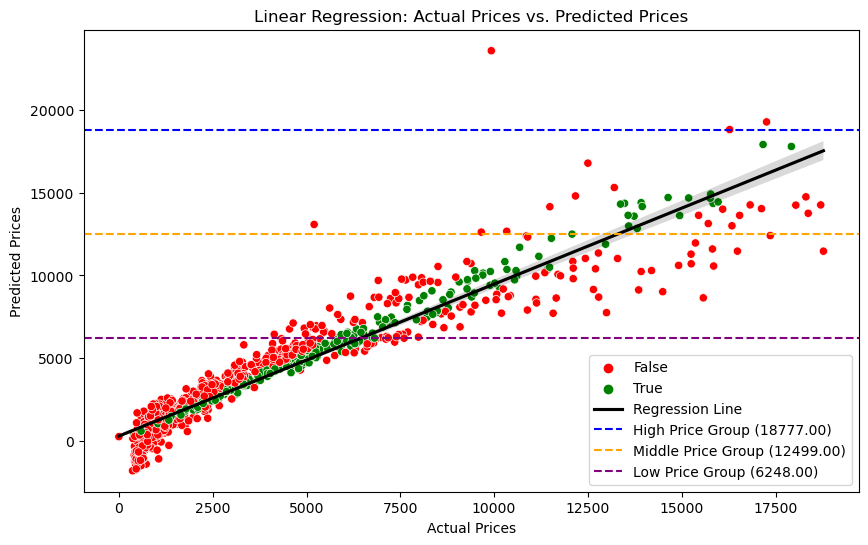

Maximum Instance Index: 999
LIME Explanation:
17802.40 < z_depth <= 21568.25: 8448.445771676352
2.90 < z <= 3.53: -6828.141078079447
0.40 < carat <= 0.70: -3876.7582916526694
26790.00 < table_width <= 32485.00: 2027.1511973468869
depth > 62.50: 1961.1273592583111
table <= 56.00: -1736.1127601720793
clarity <= 3.00: -1546.382557672773
color <= 2.00: 1310.6298973993496
4.70 < x <= 5.69: -1030.3847854050853
4.71 < y <= 5.70: -935.4093294121161
cut <= 3.00: -288.2569874518899


C:\Users\cassiorodrigo.crisfa\Anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


In [47]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error
import matplotlib.pyplot as plt
import seaborn as sns

# Read the data_diamonds.csv file
data_diamonds_path = "C:\\Users\\cassiorodrigo.crisfa\\Documents\\GitHub\\xtream-ai-assignment\\Cristani\\diamonds_C2.csv"
data_diamonds_df = pd.read_csv(data_diamonds_path, sep=',')

# Define features (X) and target variable (y)
data_diamonds_df = data_diamonds_df.drop(columns=['color_classification'])
X = data_diamonds_df.drop(columns=['price'])
y = data_diamonds_df['price']

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize the linear regression model
model = LinearRegression()

# Train the model
model.fit(X_train, y_train)

# Make predictions on the test set
y_pred = model.predict(X_test)

# Calculate percentage difference
percentage_difference = abs((y_pred - y_test) / y_test) * 100

# Identify samples within a 10% difference range
within_range = percentage_difference <= 10

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
print(f'Mean Squared Error: {mse}')

# Calculate statistics for total samples
total_samples = len(y_test)
within_range_samples = within_range.sum()
outside_range_samples = total_samples - within_range_samples
within_range_percentage = (within_range_samples / total_samples) * 100

# Divide into three groups: highest price, middle price, low price
max_price = y_test.max()
min_price = y_test.min()
price_range = max_price - min_price
threshold_low = min_price + (price_range * 1/3)
threshold_high = min_price + (price_range * 2/3)

# Categorize true values into three groups
high_price_group = y_test[y_test >= threshold_high]
middle_price_group = y_test[(y_test >= threshold_low) & (y_test < threshold_high)]
low_price_group = y_test[y_test < threshold_low]

# Calculate the mean of the maximum value for each category
mean_max_value_high_price = high_price_group.max()
mean_max_value_middle_price = middle_price_group.max()
mean_max_value_low_price = low_price_group.max()
pct = 100*within_range_samples/total_samples

# Print statistics for total samples
print(f'\nTotal Samples Statistics:', total_samples)
print(f'High Price Samples: {len(high_price_group)} ({(len(high_price_group) / total_samples) * 100:.2f}%)')
print(f'Middle Price Samples: {len(middle_price_group)} ({(len(middle_price_group) / total_samples) * 100:.2f}%)')
print(f'Low Price Samples: {len(low_price_group)} ({(len(low_price_group) / total_samples) * 100:.2f}%)')

# Print statistics for samples within 10% difference range
print(f'\nSamples Within 10% Difference Range Statistics:', within_range_samples, 'Percentage =', pct, '%')
print(f'High Price Samples: {len(high_price_group[within_range])} ({(len(high_price_group[within_range]) / within_range_samples) * 100:.2f}%)')
print(f'Middle Price Samples: {len(middle_price_group[within_range])} ({(len(middle_price_group[within_range]) / within_range_samples) * 100:.2f}%)')
print(f'Low Price Samples: {len(low_price_group[within_range])} ({(len(low_price_group[within_range]) / within_range_samples) * 100:.2f}%)')

# Plot the predicted prices against the actual prices using Seaborn
plt.figure(figsize=(10, 6))

# Define colors for low, middle, and high price samples within the 10% difference range
low_price_color = 'purple'
middle_price_color = 'orange'
high_price_color = 'blue'

# Scatter plot with color-coded categories
sns.scatterplot(x=y_test, y=y_pred, hue=within_range, palette={True: 'green', False: 'red'}, legend='full')

# Regression line
sns.regplot(x=y_test, y=y_pred, scatter=False, color='black', label='Regression Line')

# Dash lines with colors for mean max values
plt.axhline(mean_max_value_high_price, color=high_price_color, linestyle='--', label=f'High Price Group ({mean_max_value_high_price:.2f})')
plt.axhline(mean_max_value_middle_price, color=middle_price_color, linestyle='--', label=f'Middle Price Group ({mean_max_value_middle_price:.2f})')
plt.axhline(mean_max_value_low_price, color=low_price_color, linestyle='--', label=f'Low Price Group ({mean_max_value_low_price:.2f})')

plt.xlabel('Actual Prices')
plt.ylabel('Predicted Prices')
plt.title('Linear Regression: Actual Prices vs. Predicted Prices')
plt.legend()
plt.show()


# Use LIME for explaining predictions
explainer = lime_tabular.LimeTabularExplainer(X_train.values, mode="regression", feature_names=X.columns)

max_instance_index = len(X_test) - 1
print(f"Maximum Instance Index: {max_instance_index}")

# Choose a specific instance from the test set
i = 990
explanation = explainer.explain_instance(X_test.iloc[i].values, model.predict, num_features=len(X.columns))

# Print explanation
print("LIME Explanation:")
for feature, weight in explanation.as_list():
    print(f"{feature}: {weight}")

# You can also visualize the explanation if needed
explanation.show_in_notebook()


In [42]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error
import matplotlib.pyplot as plt
import seaborn as sns
from lime import lime_tabular, lime_text

# Read the data_diamonds.csv file
data_diamonds_path = "C:\\Users\\cassiorodrigo.crisfa\\Documents\\GitHub\\xtream-ai-assignment\\Cristani\\diamonds_C2.csv"
data_diamonds_df = pd.read_csv(data_diamonds_path, sep=',')

# Define features (X) and target variable (y)
data_diamonds_df = data_diamonds_df.drop(columns=['color_classification'])
X = data_diamonds_df.drop(columns=['price'])
y = data_diamonds_df['price']

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize the random forest model
model = RandomForestRegressor()

# Train the model
model.fit(X_train, y_train)

# Make predictions on the test set
y_pred = model.predict(X_test)

# Calculate percentage difference
percentage_difference = abs((y_pred - y_test) / y_test) * 100

# Identify samples within a 10% difference range
within_range = percentage_difference <= 10

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
print(f'Mean Squared Error: {mse}')

# Use LIME for explaining predictions
explainer = lime_tabular.LimeTabularExplainer(X_train.values, mode="regression")
i = 0  # Choose a specific instance from the test set
explanation = explainer.explain_instance(X_test.iloc[i].values, model.predict, num_features=len(X.columns))

# Print explanation
print(explanation.show_in_notebook())


Mean Squared Error: 461467.7073053999


C:\Users\cassiorodrigo.crisfa\Anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(


None


In [20]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error
import matplotlib.pyplot as plt
import seaborn as sns
from lime import lime_tabular

# Read the data_diamonds.csv file
data_diamonds_path = "C:\\Users\\cassiorodrigo.crisfa\\Documents\\GitHub\\xtream-ai-assignment\\Cristani\\diamonds_C2.csv"
data_diamonds_df = pd.read_csv(data_diamonds_path, sep=',')

# Define features (X) and target variable (y)
data_diamonds_df = data_diamonds_df.drop(columns=['color_classification'])
X = data_diamonds_df.drop(columns=['price'])
y = data_diamonds_df['price']

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize the random forest model
model = LinearRegression()

# Train the model
model.fit(X_train, y_train)

# Make predictions on the test set
y_pred = model.predict(X_test)

# Calculate percentage difference
percentage_difference = abs((y_pred - y_test) / y_test) * 100

# Identify samples within a 10% difference range
within_range = percentage_difference <= 10

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
print(f'Mean Squared Error: {mse}')

# Use LIME for explaining predictions
explainer = lime_tabular.LimeTabularExplainer(X_train.values, mode="regression", feature_names=X.columns)

max_instance_index = len(X_test) - 1
print(f"Maximum Instance Index: {max_instance_index}")

# Choose a specific instance from the test set
i = 0
explanation = explainer.explain_instance(X_test.iloc[i].values, model.predict, num_features=len(X.columns))

# Print explanation
print("LIME Explanation:")
for feature, weight in explanation.as_list():
    print(f"{feature}: {weight}")

# You can also visualize the explanation if needed
explanation.show_in_notebook()


Mean Squared Error: 1531553.3805091383
Maximum Instance Index: 999
LIME Explanation:
17802.40 < z_depth <= 21568.25: 6719.625017932069
2.90 < z <= 3.53: -6709.594024106275
0.40 < carat <= 0.70: -3602.4957016765384
26790.00 < table_width <= 32485.00: 2127.707554933916
clarity > 5.00: 1582.2592041198232
4.71 < y <= 5.70: -733.8427964294792
61.80 < depth <= 62.50: 555.4584609311484
4.70 < x <= 5.69: -426.0637537910236
57.00 < table <= 59.00: 317.43213930310316
2.00 < color <= 4.00: -231.6402630723336
3.00 < cut <= 4.00: 55.28134046333584


C:\Users\cassiorodrigo.crisfa\Anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


Total original samples: 1000
Total samples after filtering ( 10.0 %): 311 (31.10%)
Total overestimated samples after filtering (> 0 and margin 0.1): 183 (18.30%)
Total underestimated samples after filtering (< 0 and margin 0.1): 128 (12.80%)
Average absolute difference for overestimated samples after filtering: 1384.25
Standard deviation for overestimated samples after filtering: 1153.96
Average absolute difference for underestimated samples after filtering: 2113.74
Standard deviation for underestimated samples after filtering: 1294.61


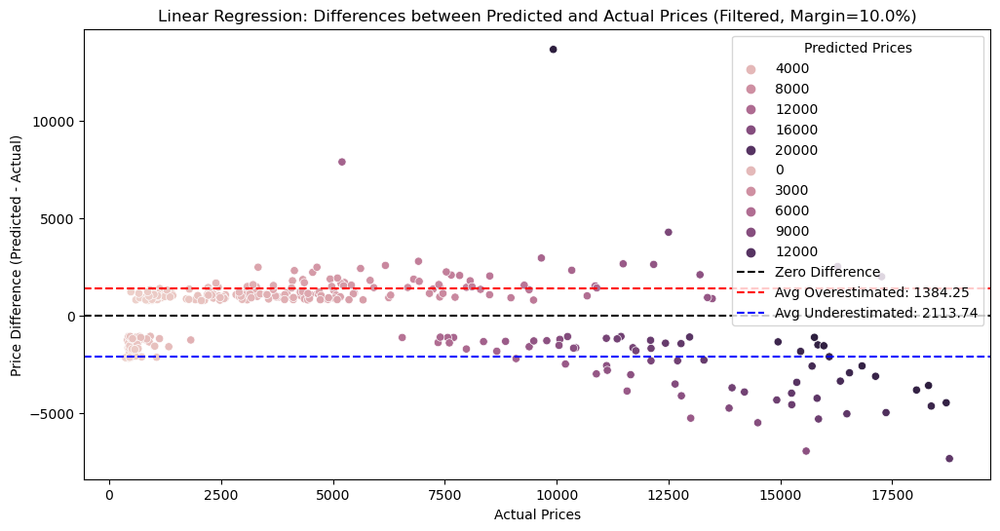

Maximum Instance Index: 999
LIME Explanation:
17802.40 < z_depth <= 21568.25: 7069.17262623411
2.90 < z <= 3.53: -6063.789983152582
0.40 < carat <= 0.70: -4157.989616377507
26790.00 < table_width <= 32485.00: 2382.7501376408927
clarity > 5.00: 1437.7735994010577
4.71 < y <= 5.70: -807.3348977554334
61.80 < depth <= 62.50: 575.2757313726803
4.70 < x <= 5.69: -422.2672458977152
3.00 < cut <= 4.00: -295.6378180708466
57.00 < table <= 59.00: 182.9362508219411
2.00 < color <= 4.00: -114.33027190598749


C:\Users\cassiorodrigo.crisfa\Anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


In [22]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
import matplotlib.pyplot as plt
import seaborn as sns

data_diamonds_path = "C:\\Users\\cassiorodrigo.crisfa\\Documents\\GitHub\\xtream-ai-assignment\\Cristani\\diamonds_C2.csv"
data_diamonds_df = pd.read_csv(data_diamonds_path, sep=',')

# Define features (X) and target variable (y)
data_diamonds_df = data_diamonds_df.drop(columns=['color_classification'])
X = data_diamonds_df.drop(columns=['price'])
y = data_diamonds_df['price']

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize the linear regression model
model = LinearRegression()

# Train the model
model.fit(X_train, y_train)

# Make predictions on the test set
y_pred = model.predict(X_test)

# Create a DataFrame for visualization
df_visualization = pd.DataFrame({'Actual Prices': y_test, 'Predicted Prices': y_pred})

# Calculate the differences between predicted and actual prices
df_visualization['Price Difference'] = df_visualization['Predicted Prices'] - df_visualization['Actual Prices']

# Calculate the absolute differences
df_visualization['Absolute Difference'] = abs(df_visualization['Price Difference'])

# Set a threshold for underestimation (adjust as needed)
underestimate_threshold = 0

# Identify underestimated samples
df_visualization['Underestimated'] = df_visualization['Price Difference'] < underestimate_threshold

# Identify overestimated samples
df_visualization['Overestimated'] = df_visualization['Price Difference'] > underestimate_threshold

# Filter out samples within a margin 
margin = 0.10 
avg_abs_diff_overestimated = df_visualization.loc[df_visualization['Overestimated'], 'Absolute Difference'].mean()
avg_abs_diff_underestimated = df_visualization.loc[df_visualization['Underestimated'], 'Absolute Difference'].mean()

df_filtered_overestimated = df_visualization.loc[df_visualization['Overestimated'] & (df_visualization['Absolute Difference'] > (1 + margin) * avg_abs_diff_overestimated)]
df_filtered_underestimated = df_visualization.loc[df_visualization['Underestimated'] & (df_visualization['Absolute Difference'] > (1 + margin) * avg_abs_diff_underestimated)]

# Count the number of original samples
total_samples = len(df_visualization)

# Count the number of samples after filtering
total_samples_filtered = len(df_filtered_overestimated) + len(df_filtered_underestimated)
total_overestimated_filtered = len(df_filtered_overestimated)
total_underestimated_filtered = len(df_filtered_underestimated)

# Calculate average and standard deviation for overestimated and underestimated samples after filtering
avg_overestimated_filtered = df_filtered_overestimated['Absolute Difference'].mean()
std_overestimated_filtered = df_filtered_overestimated['Absolute Difference'].std()

avg_underestimated_filtered = df_filtered_underestimated['Absolute Difference'].mean()
std_underestimated_filtered = df_filtered_underestimated['Absolute Difference'].std()

# Print the number of original samples
print(f'Total original samples: {total_samples}')

# Print the number and percentage of samples after filtering
print(f'Total samples after filtering ( {100*margin} %): {total_samples_filtered} ({total_samples_filtered / total_samples * 100:.2f}%)')
print(f'Total overestimated samples after filtering (> {underestimate_threshold} and margin {margin}): {total_overestimated_filtered} '
      f'({total_overestimated_filtered / total_samples * 100:.2f}%)')
print(f'Total underestimated samples after filtering (< {underestimate_threshold} and margin {margin}): {total_underestimated_filtered} '
      f'({total_underestimated_filtered / total_samples * 100:.2f}%)')

# Print average and standard deviation for overestimated and underestimated samples after filtering
print(f'Average absolute difference for overestimated samples after filtering: {avg_overestimated_filtered:.2f}')
print(f'Standard deviation for overestimated samples after filtering: {std_overestimated_filtered:.2f}')

print(f'Average absolute difference for underestimated samples after filtering: {avg_underestimated_filtered:.2f}')
print(f'Standard deviation for underestimated samples after filtering: {std_underestimated_filtered:.2f}')

# Plot the differences with actual prices on the x-axis after filtering
plt.figure(figsize=(12, 6))
sns.scatterplot(x='Actual Prices', y='Price Difference', hue='Predicted Prices', data=df_filtered_overestimated)
sns.scatterplot(x='Actual Prices', y='Price Difference', hue='Predicted Prices', data=df_filtered_underestimated)
plt.axhline(y=0, color='black', linestyle='--', label='Zero Difference')
plt.axhline(y=avg_overestimated_filtered, color='red', linestyle='--', label=f'Avg Overestimated: {avg_overestimated_filtered:.2f}')
plt.axhline(y=-avg_underestimated_filtered, color='blue', linestyle='--', label=f'Avg Underestimated: {avg_underestimated_filtered:.2f}')

plt.xlabel('Actual Prices')
plt.ylabel('Price Difference (Predicted - Actual)')
plt.title(f'Linear Regression: Differences between Predicted and Actual Prices (Filtered, Margin={margin * 100}%)')
plt.legend(title='Predicted Prices')
plt.show()

# Use LIME for explaining predictions
explainer = lime_tabular.LimeTabularExplainer(X_train.values, mode="regression", feature_names=X.columns)

max_instance_index = len(X_test) - 1
print(f"Maximum Instance Index: {max_instance_index}")

# Choose a specific instance from the test set
i = 0
explanation = explainer.explain_instance(X_test.iloc[i].values, model.predict, num_features=len(X.columns))

# Print explanation
print("LIME Explanation:")
for feature, weight in explanation.as_list():
    print(f"{feature}: {weight}")

# You can also visualize the explanation if needed
explanation.show_in_notebook()


Total original samples: 1000
Total samples after filtering ( 10.0 %): 311 (31.10%)
Total overestimated samples after filtering (> 0 and margin 0.1): 183 (18.30%)
Total underestimated samples after filtering (< 0 and margin 0.1): 128 (12.80%)
Average absolute difference for overestimated samples after filtering: 1384.25
Standard deviation for overestimated samples after filtering: 1153.96
Average absolute difference for underestimated samples after filtering: 2113.74
Standard deviation for underestimated samples after filtering: 1294.61


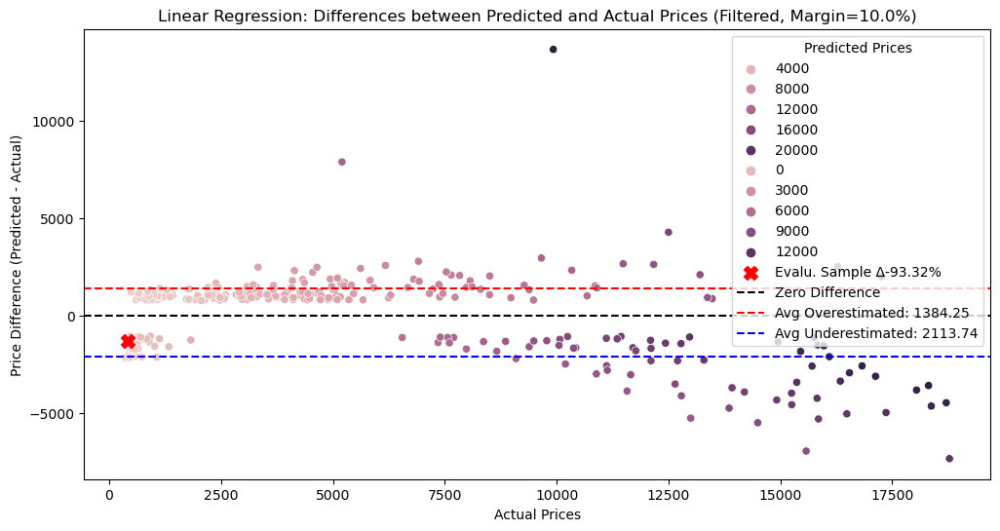

LIME Explanation:
Instance Index: 222
Actual Price: 422
Predicted Price: -869.8341940579849
Price Difference: -1291.8341940579849
Overestimated: False
Underestimated: True
Feature Weights:
z_depth <= 17802.40: 17904.948038044364
z <= 2.90: -17176.206341572903
carat <= 0.40: -7400.771490821799
table_width <= 26790.00: 5836.885005669393
y <= 4.71: -2169.3005679707494
x <= 4.70: -2024.004635077404
clarity <= 3.00: -1702.6642777572517
table <= 56.00: -730.3549600964568
2.00 < color <= 4.00: -362.71367452010605
61.80 < depth <= 62.50: 352.29456341504783
4.00 < cut <= 5.00: -35.73266292895763


C:\Users\cassiorodrigo.crisfa\Anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
C:\Users\cassiorodrigo.crisfa\Anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


In [37]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
import matplotlib.pyplot as plt
import seaborn as sns
import lime
import lime.lime_tabular

data_diamonds_path = "C:\\Users\\cassiorodrigo.crisfa\\Documents\\GitHub\\xtream-ai-assignment\\Cristani\\diamonds_C2.csv"
data_diamonds_df = pd.read_csv(data_diamonds_path, sep=',')

# Define features (X) and target variable (y)
data_diamonds_df = data_diamonds_df.drop(columns=['color_classification'])
X = data_diamonds_df.drop(columns=['price'])
y = data_diamonds_df['price']

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize the linear regression model
model = LinearRegression()

# Train the model
model.fit(X_train, y_train)

# Make predictions on the test set
y_pred = model.predict(X_test)

# Create a DataFrame for visualization
df_visualization = pd.DataFrame({'Actual Prices': y_test, 'Predicted Prices': y_pred})

# Calculate the differences between predicted and actual prices
df_visualization['Price Difference'] = df_visualization['Predicted Prices'] - df_visualization['Actual Prices']

# Calculate the absolute differences
df_visualization['Absolute Difference'] = abs(df_visualization['Price Difference'])

# Set a threshold for underestimation (adjust as needed)
underestimate_threshold = 0

# Identify underestimated samples
df_visualization['Underestimated'] = df_visualization['Price Difference'] < underestimate_threshold

# Identify overestimated samples
df_visualization['Overestimated'] = df_visualization['Price Difference'] > underestimate_threshold

# Filter out samples within a margin 
margin = 0.10 
avg_abs_diff_overestimated = df_visualization.loc[df_visualization['Overestimated'], 'Absolute Difference'].mean()
avg_abs_diff_underestimated = df_visualization.loc[df_visualization['Underestimated'], 'Absolute Difference'].mean()

df_filtered_overestimated = df_visualization.loc[df_visualization['Overestimated'] & (df_visualization['Absolute Difference'] > (1 + margin) * avg_abs_diff_overestimated)]
df_filtered_underestimated = df_visualization.loc[df_visualization['Underestimated'] & (df_visualization['Absolute Difference'] > (1 + margin) * avg_abs_diff_underestimated)]

# Count the number of original samples
total_samples = len(df_visualization)

# Count the number of samples after filtering
total_samples_filtered = len(df_filtered_overestimated) + len(df_filtered_underestimated)
total_overestimated_filtered = len(df_filtered_overestimated)
total_underestimated_filtered = len(df_filtered_underestimated)

# Calculate average and standard deviation for overestimated and underestimated samples after filtering
avg_overestimated_filtered = df_filtered_overestimated['Absolute Difference'].mean()
std_overestimated_filtered = df_filtered_overestimated['Absolute Difference'].std()

avg_underestimated_filtered = df_filtered_underestimated['Absolute Difference'].mean()
std_underestimated_filtered = df_filtered_underestimated['Absolute Difference'].std()

# Print the number of original samples
print(f'Total original samples: {total_samples}')

# Print the number and percentage of samples after filtering
print(f'Total samples after filtering ( {100*margin} %): {total_samples_filtered} ({total_samples_filtered / total_samples * 100:.2f}%)')
print(f'Total overestimated samples after filtering (> {underestimate_threshold} and margin {margin}): {total_overestimated_filtered} '
      f'({total_overestimated_filtered / total_samples * 100:.2f}%)')
print(f'Total underestimated samples after filtering (< {underestimate_threshold} and margin {margin}): {total_underestimated_filtered} '
      f'({total_underestimated_filtered / total_samples * 100:.2f}%)')

# Print average and standard deviation for overestimated and underestimated samples after filtering
print(f'Average absolute difference for overestimated samples after filtering: {avg_overestimated_filtered:.2f}')
print(f'Standard deviation for overestimated samples after filtering: {std_overestimated_filtered:.2f}')

print(f'Average absolute difference for underestimated samples after filtering: {avg_underestimated_filtered:.2f}')
print(f'Standard deviation for underestimated samples after filtering: {std_underestimated_filtered:.2f}')

# Plot the differences with actual prices on the x-axis after filtering
plt.figure(figsize=(12, 6))
sns.scatterplot(x='Actual Prices', y='Price Difference', hue='Predicted Prices', data=df_filtered_overestimated)
sns.scatterplot(x='Actual Prices', y='Price Difference', hue='Predicted Prices', data=df_filtered_underestimated)

# Plot the evaluated sample in red
evaluated_sample_index = i
evaluated_sample_actual_price = y_test.iloc[evaluated_sample_index]
evaluated_sample_predicted_price = prediction
evaluated_sample_difference = evaluated_sample_predicted_price - evaluated_sample_actual_price

# Calculate the percentage out from the threshold zero point
percentage_out = (evaluated_sample_difference / avg_overestimated_filtered) * 100

plt.scatter(evaluated_sample_actual_price, evaluated_sample_difference, color='red', marker='X', s=100, label=f'Evalu. Sample Δ{percentage_out:.2f}% ')

plt.axhline(y=0, color='black', linestyle='--', label='Zero Difference')
plt.axhline(y=avg_overestimated_filtered, color='red', linestyle='--', label=f'Avg Overestimated: {avg_overestimated_filtered:.2f}')
plt.axhline(y=-avg_underestimated_filtered, color='blue', linestyle='--', label=f'Avg Underestimated: {avg_underestimated_filtered:.2f}')

plt.xlabel('Actual Prices')
plt.ylabel('Price Difference (Predicted - Actual)')
plt.title(f'Linear Regression: Differences between Predicted and Actual Prices (Filtered, Margin={margin * 100}%)')
plt.legend(title='Predicted Prices')
plt.show()

# Use LIME for explaining predictions
explainer = lime.lime_tabular.LimeTabularExplainer(X_train.values, mode="regression", feature_names=X.columns)

# Choose a specific instance from the test set
i = 222
instance = X_test.iloc[i].values
prediction = model.predict([instance])[0]

# Explain the prediction
explanation = explainer.explain_instance(instance, model.predict, num_features=len(X.columns))

# Print explanation
print("LIME Explanation:")
print(f"Instance Index: {i}")
print(f"Actual Price: {y_test.iloc[i]}")
print(f"Predicted Price: {prediction}")
print(f"Price Difference: {prediction - y_test.iloc[i]}")
print(f"Overestimated: {df_visualization['Overestimated'].iloc[i]}")
print(f"Underestimated: {df_visualization['Underestimated'].iloc[i]}")
print("Feature Weights:")
for feature, weight in explanation.as_list():
    print(f"{feature}: {weight}")
    
explanation.show_in_notebook()
